In [1]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
print(tf.__version__),print(hub.__version__)

2.12.0
0.13.0


(None, None)

In [3]:
tf.config.experimental.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
labels_csv=pd.read_csv('/content/drive/MyDrive/Dog Vision/labels.csv')
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [6]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


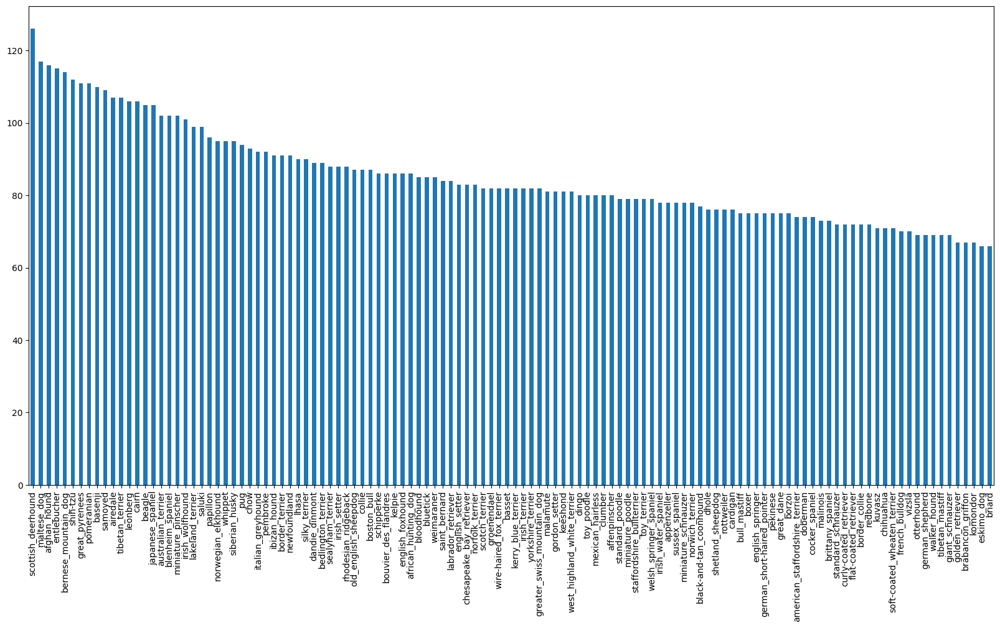

In [7]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));

In [8]:
from IPython.display import display, Image

In [9]:
filenames=['/content/drive/MyDrive/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]
filenames[0]

'/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg'

In [10]:
import os
if len(os.listdir('/content/drive/MyDrive/Dog Vision/train/')) == len(filenames):
  print('Matches')
else:
  print("Mismatch")

Matches


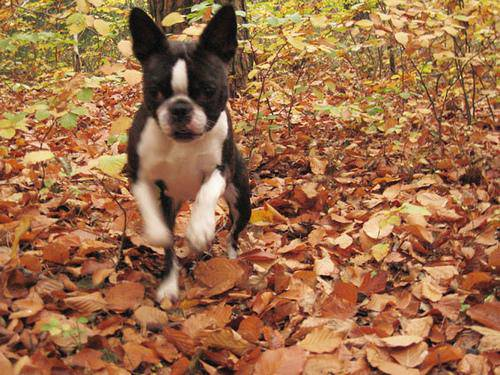

In [11]:
Image(filenames[0])

In [12]:
labels=labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [13]:
labels.shape

(10222,)

In [14]:
if len(labels)==len(filenames):
  print("Labels and files match")
else:
  print("Mismatch")

Labels and files match


In [15]:
unique_labels=np.unique(labels)
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
unique_labels.shape

(120,)

In [17]:
boolean_labels=[label == np.array(unique_labels) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels), type(boolean_labels)

(10222, list)

In [19]:
print(labels[0])

boston_bull


In [20]:
print(np.where(unique_labels==labels[0])[0][0])

19


In [21]:
print(boolean_labels[0].argmax())

19


In [22]:
print(boolean_labels[0].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
X=filenames
y=boolean_labels

In [24]:
X[:2],y[:2]

(['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,

In [25]:
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:1000}
NUM_IMAGES

1000

In [26]:
from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)

len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [27]:
X_train[:5],y_train[:5]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

In [28]:
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [29]:
type(image)

numpy.ndarray

In [30]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [31]:
IMG_SIZE=224

def process_image(image_path):
  """
  Take the image path and turn it into a tensor
  """
  image=tf.io.read_file(image_path)
  image=tf.image.decode_jpeg(image, channels=3)
  image=tf.image.convert_image_dtype(image, tf.float32)
  image=tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])
  return image

In [32]:
def get_image_label(image_path,label):
  """
  Takes the image file path name and it's label,
  processes the image and returns a tuple(image,label)
  """
  image=process_image(image_path)
  return image, label

In [33]:
BATCH_SIZE=32

def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Create data batches of image(x) and label(y),
  Shuffle training data and not validation data,
  Accept test data as input with no labels
  """
  # If it's test data, we won't have labels
  if test_data:
    print("Create test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))  
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If it's valid data set we don't need to shuffle it and will have x and y
  elif valid_data:
    print("Create valid data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If the data is training, we shuffle it
  else:
    print("Create train data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data=data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)
    return data_batch

In [34]:
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Create train data batches
Create valid data batches


In [35]:
len(train_data),len(val_data)

(25, 7)

In [36]:
# Checking the attributes of different data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [37]:
# It's in a batch and since we can't iterate over a batch, we have to unbatch it
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [38]:
train_images,train_labels = next(train_data.as_numpy_iterator())
val_images,val_labels=next(val_data.as_numpy_iterator())

In [39]:
def show_25_images(images,labels):
  """
  Display a plot of 25 images from the data batch
  """
  plt.figure(figsize=(10,10))

  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_labels[labels[i].argmax()])
    plt.axis('off')

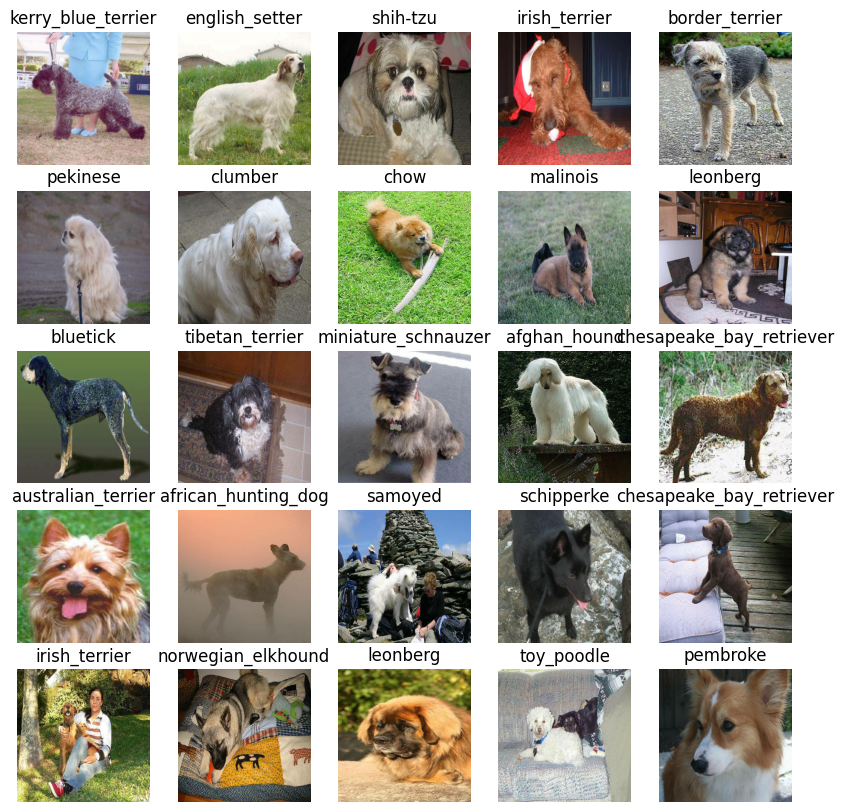

In [40]:
show_25_images(train_images,train_labels)

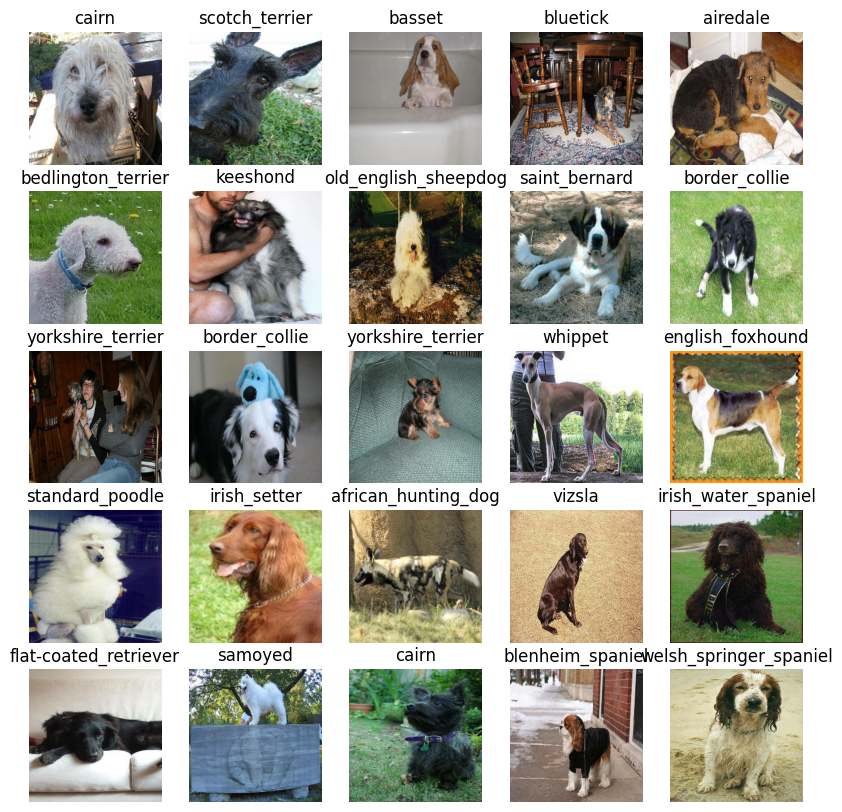

In [41]:
show_25_images(val_images,val_labels)

In [42]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

OUTPUT_SHAPE=len(unique_labels)

MODEL_URL='https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5'

In [43]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  model=tf.keras.Sequential([
                            hub.KerasLayer(MODEL_URL),
                            tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                  activation='Softmax')
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
)
  model.build(INPUT_SHAPE)

  return model

In [44]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5508713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,628,953
Trainable params: 120,240
Non-trainable params: 5,508,713
_________________________________________________________________


In [45]:
 %load_ext tensorboard

In [46]:
import datetime

def create_tensorboard_callback():
  logdir=os.path.join('/content/drive/MyDrive/Dog Vision/logs',
                      datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  
  return tf.keras.callbacks.TensorBoard(logdir)

In [47]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                patience=3)

In [48]:
NUM_EPOCHS=100

In [49]:
def train_model():
  """
  Train the model and returns the trained model
  """
  model=create_model()

  tensorboard=create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  
  return model

In [50]:
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
Epoch 1/100
25/25 [==============================] - 209s 8s/step - loss: 4.8079 - accuracy: 0.0775 - val_loss: 3.6627 - val_accuracy: 0.2050
Epoch 2/100
25/25 [==============================] - 4s 156ms/step - loss: 1.8886 - accuracy: 0.6600 - val_loss: 2.3643 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 3s 119ms/step - loss: 0.6674 - accuracy: 0.9175 - val_loss: 1.8423 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 3s 118ms/step - loss: 0.2932 - accuracy: 0.9800 - val_loss: 1.6586 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 4s 155ms/step - loss: 0.1587 - accuracy: 0.9987 - val_loss: 1.5730 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 146ms/step - loss: 0.1056 - accuracy: 0.9987 - val_loss: 1.5273 - val_accuracy: 0.6350
Epoch 7/100
25/25 [=========================

In [51]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

In [52]:
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 1s 88ms/step


array([[1.7502850e-02, 9.6692319e-04, 1.0878520e-04, ..., 1.2594776e-04,
        6.1365594e-05, 1.0386133e-02],
       [4.4738546e-05, 4.5129118e-04, 5.1284162e-04, ..., 1.1802757e-03,
        1.6435501e-03, 4.0025392e-05],
       [1.2517034e-05, 3.5122001e-05, 1.6721402e-04, ..., 5.7088205e-04,
        1.1634177e-04, 7.0306001e-04],
       ...,
       [1.7818263e-06, 9.1854617e-06, 3.7899845e-05, ..., 6.6935995e-06,
        1.1458343e-05, 3.1397456e-05],
       [3.1927091e-04, 2.1627688e-04, 1.9448942e-05, ..., 3.7768619e-05,
        8.0152138e-05, 7.5464980e-03],
       [3.0795331e-05, 2.4632001e-04, 1.3717739e-03, ..., 3.2686198e-04,
        1.6126585e-04, 3.5816096e-04]], dtype=float32)

In [53]:
predictions[0]

array([1.7502850e-02, 9.6692319e-04, 1.0878520e-04, 1.1578865e-04,
       1.1036751e-03, 2.3203302e-04, 7.5413645e-03, 9.0661645e-04,
       6.3301501e-04, 1.2780116e-04, 1.5204768e-03, 2.8587130e-04,
       1.9238681e-04, 1.3567269e-04, 1.1651615e-03, 5.4064533e-04,
       1.5019673e-03, 1.4498720e-01, 5.4307046e-05, 2.5258050e-04,
       5.0802208e-03, 1.2107930e-03, 9.1037014e-05, 4.1471091e-03,
       1.8392119e-04, 2.0497777e-04, 5.3316861e-02, 3.7024001e-04,
       6.1518559e-04, 9.1413283e-05, 4.5001148e-03, 9.4436097e-04,
       4.0783561e-04, 2.5425144e-04, 6.9952663e-04, 1.7925380e-02,
       4.7800416e-04, 1.1040599e-03, 1.4730179e-04, 5.5438711e-04,
       1.8668424e-03, 1.0755442e-04, 6.6975539e-04, 4.2402488e-03,
       9.3143417e-06, 4.4514262e-03, 3.1413476e-04, 1.3456168e-03,
       2.1010942e-03, 9.8327838e-04, 2.8545898e-04, 6.3973719e-05,
       7.9403557e-03, 1.3163072e-04, 1.0761680e-03, 1.4153127e-04,
       8.3477056e-04, 3.6982503e-03, 1.8541394e-04, 1.3556801e

In [54]:
predictions.shape

(200, 120)

In [55]:
index=42
print(predictions[index])
print(f"Probability value {np.max(predictions[index])}")
print(f"Sum = {np.sum(predictions[index])}")
print(f"Max value = {np.argmax(predictions[index])}")
print(f"Predicted label is {unique_labels[np.argmax(predictions[index])]}")

[1.57570612e-04 1.82205458e-05 2.73005251e-04 2.59932276e-04
 7.80275805e-05 9.40012251e-06 1.54448644e-04 4.13233996e-04
 7.95685966e-03 2.33366489e-02 1.68209444e-04 3.59373007e-05
 4.48448583e-04 7.52552936e-04 4.28402796e-04 3.03134276e-03
 2.19866633e-05 1.02949081e-04 2.90432043e-04 2.31509221e-05
 1.53004094e-05 1.73457491e-04 7.47828199e-06 2.74937356e-05
 4.14966140e-03 3.10230371e-06 7.24488564e-05 2.64223181e-05
 1.52504272e-05 7.43336932e-05 1.60316958e-05 2.70834171e-05
 1.21809035e-05 2.96769314e-04 2.86816230e-05 1.69472059e-05
 2.73290461e-05 7.97516768e-05 4.76382556e-05 6.66391611e-01
 8.16343672e-05 3.82236212e-05 2.58314365e-04 8.74568195e-06
 5.58403262e-05 8.94495497e-06 5.45936273e-05 3.19852203e-04
 1.67428498e-05 4.14255192e-05 9.56318472e-05 9.47541703e-05
 2.96093669e-04 5.37173299e-04 5.92514989e-05 2.48211902e-04
 1.00218595e-05 2.88605461e-05 1.13472961e-04 3.94205745e-05
 9.46990076e-06 8.25953102e-05 2.12363273e-04 1.63658769e-05
 4.35123875e-05 1.133993

In [56]:
def get_predicted_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_labels[np.argmax(prediction_probabilities)]

pred_label=get_predicted_label(predictions[0])
pred_label

'border_terrier'

In [57]:
def unbatchify(data):
  """
  Takes a batch dataset of (images,labels)tensors and returns seperate arrays of images and labels
  """
  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])

  return images,labels

In [58]:
val_images,val_labels=unbatchify(val_data)

In [59]:
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [60]:
 def plot_pred(prediction_probabilities,labels,images,n=1):
   """
   View the prediction, ground truth label and image for sample n.
   """
   pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

   pred_label=get_predicted_label(pred_prob)

   plt.imshow(image)
   plt.xticks([])
   plt.yticks([])

   if pred_label==true_label:
     color='green'
   else:
     color='red'

   plt.title("{} {:2.0f}% {}".format(pred_label,
                               np.max(pred_prob)*100,
                               true_label),
                               color=color)
                               

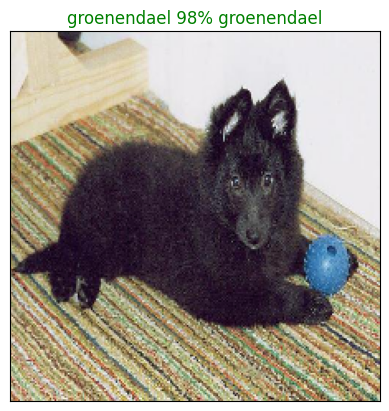

In [61]:
plot_pred(predictions,val_labels,val_images,n=77)

In [62]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  pred_label=get_predicted_label(pred_prob)
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_labels=unique_labels[top_10_pred_indexes]

  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                             top_10_pred_values,
                             color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
                       labels=top_10_pred_labels,
                       rotation='vertical')

  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass

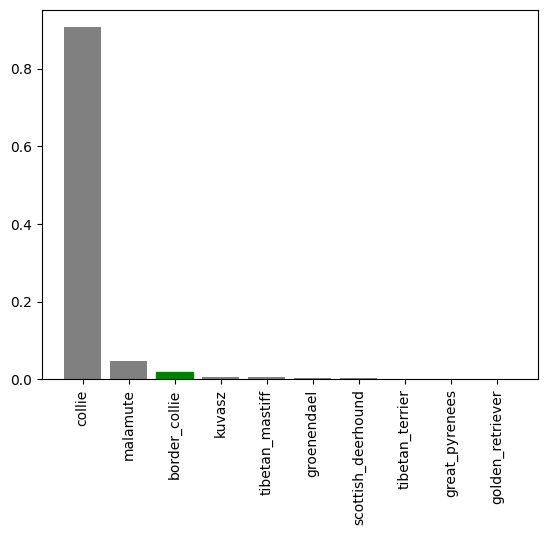

In [63]:
plot_pred_conf(predictions,val_labels,n=9)

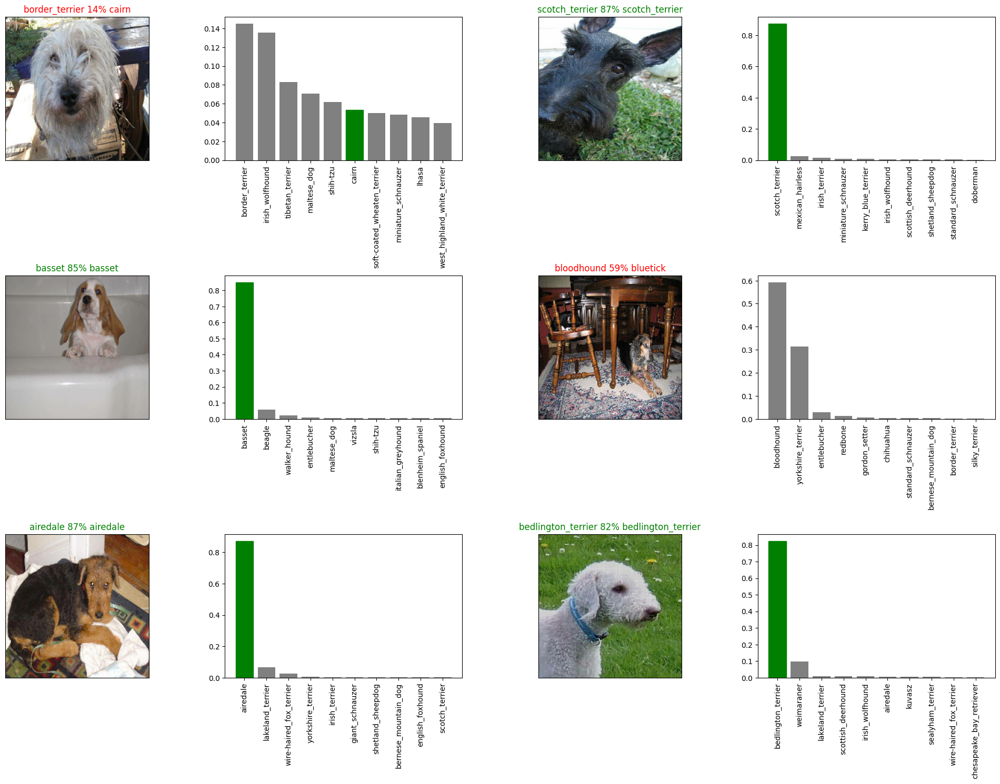

In [64]:
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions,val_labels,val_images,i+i_multiplier)

  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(predictions,val_labels,i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

In [65]:
def save_model(model,suffix=None):
  """
  Saves the model in the folder and appends a suffix(string)
  """
  model_dir=os.path.join('/content/drive/MyDrive/Dog Vision/models',
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  model_path=model_dir+"-"+suffix+".h5"
  print(f"Saving the model {model_path}")
  model.save(model_path)

  return model_path

In [66]:
def load_model(model_path):
  """
  Load the saved model from the directory
  """
  print(f"Loading saved model from {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  
  return model


In [67]:
save_model(model,suffix='1000_images_mobilenet_Adam')

Saving the model /content/drive/MyDrive/Dog Vision/models/20230430-113854-1000_images_mobilenet_Adam.h5


'/content/drive/MyDrive/Dog Vision/models/20230430-113854-1000_images_mobilenet_Adam.h5'

In [68]:
loaded_1000_model=load_model('/content/drive/MyDrive/Dog Vision/models/20230428-201105-1000_images_mobilenet_Adam.h5')

Loading saved model from /content/drive/MyDrive/Dog Vision/models/20230428-201105-1000_images_mobilenet_Adam.h5


In [69]:
model.evaluate(val_data)

7/7 [==============================] - 1s 83ms/step - loss: 1.4282 - accuracy: 0.6450


[1.4282115697860718, 0.6449999809265137]

In [70]:
loaded_1000_model.evaluate(val_data)

7/7 [==============================] - 1s 90ms/step - loss: 1.3623 - accuracy: 0.6400


[1.362329363822937, 0.6399999856948853]

In [71]:
len(X),len(y)

(10222, 10222)

In [72]:
full_data=create_data_batches(X,y)

Create train data batches


In [73]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [74]:
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5


In [75]:
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)

In [76]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 41s 110ms/step - loss: 1.3749 - accuracy: 0.6695
Epoch 2/100
320/320 [==============================] - 37s 115ms/step - loss: 0.3903 - accuracy: 0.8851
Epoch 3/100
320/320 [==============================] - 34s 106ms/step - loss: 0.2248 - accuracy: 0.9412
Epoch 4/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1415 - accuracy: 0.9689
Epoch 5/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0955 - accuracy: 0.9826
Epoch 6/100
320/320 [==============================] - 35s 111ms/step - loss: 0.0678 - accuracy: 0.9912
Epoch 7/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0510 - accuracy: 0.9947
Epoch 8/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0409 - accuracy: 0.9962
Epoch 9/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0328 - accuracy: 0.9974
Epoch 10/100
320/320 [==============================] - 34s 106m

In [77]:
save_model(full_model,suffix='All_images_Adam')

Saving the model /content/drive/MyDrive/Dog Vision/models/20230430-115150-All_images_Adam.h5


'/content/drive/MyDrive/Dog Vision/models/20230430-115150-All_images_Adam.h5'

In [78]:
loaded_full_model=load_model('/content/drive/MyDrive/Dog Vision/models/20230429-121847-All_images_Adam.h5')

Loading saved model from /content/drive/MyDrive/Dog Vision/models/20230429-121847-All_images_Adam.h5


In [79]:
test_path='/content/drive/MyDrive/Dog Vision/test/'
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:5]

['/content/drive/MyDrive/Dog Vision/test/e78b50f1d12148deef4c564ea4c88050.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7be7b911a4cba9fdfa4105ec4776370.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e78b4a09e5f86c330e24c6aaed63f0be.jpg']

In [80]:
len(test_filenames)

10357

In [81]:
test_data=create_data_batches(test_filenames,test_data=True)

Create test data batches


In [82]:
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 221s 643ms/step


In [83]:
test_predictions[:1]

array([[6.12205555e-12, 2.56932653e-09, 1.82453514e-11, 7.46132045e-11,
        3.24491237e-12, 5.42176408e-11, 1.26517140e-15, 1.33607275e-12,
        1.86614138e-13, 2.16121378e-13, 2.02821737e-09, 2.01921032e-11,
        5.25001971e-13, 3.73806211e-13, 4.53436066e-10, 3.83528487e-10,
        6.82722698e-11, 6.31980440e-11, 3.84364589e-11, 3.04831312e-12,
        3.16356857e-10, 7.74680816e-14, 4.88631867e-13, 4.19924900e-10,
        2.97939212e-12, 1.66061175e-11, 5.61598625e-08, 8.43789622e-12,
        8.48266790e-10, 4.28988063e-13, 1.66566657e-13, 2.59900890e-12,
        3.24856773e-11, 6.50681245e-11, 6.39521769e-10, 6.65091671e-09,
        6.85593249e-12, 4.70965226e-13, 1.13958053e-11, 1.81258408e-09,
        2.54416821e-09, 2.17119919e-10, 1.85104406e-12, 1.08347211e-11,
        4.33438441e-09, 1.98728058e-14, 3.68884784e-11, 2.06426065e-12,
        1.06005755e-05, 1.55386010e-10, 7.97780383e-11, 8.23930506e-08,
        1.49233670e-09, 7.73043504e-11, 4.01751243e-10, 6.389361

In [84]:
preds_df=pd.DataFrame(columns=['id']+list(unique_labels))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [87]:
os.path.splitext(filenames[0])

('/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07',
 '.jpg')

In [90]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:2]

['e78b50f1d12148deef4c564ea4c88050', 'e7ce78e874945f182a4f5149aa505b09']

In [91]:
preds_df['id']=test_ids
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e78b50f1d12148deef4c564ea4c88050,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7ce78e874945f182a4f5149aa505b09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7afcce6e45858fc3b294cc5c0b15a53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7be7b911a4cba9fdfa4105ec4776370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e78b4a09e5f86c330e24c6aaed63f0be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,084585fd8a9fcef3c7261669cacbc1be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,080a64bd87b1e0f5c96b37acea9da4ee,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,07f36df95c5fc473f2fbf51c0929ee7d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,0820dacdc8a994a932d0bae3abd0a15b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [92]:
preds_df[list(unique_labels)]=test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e78b50f1d12148deef4c564ea4c88050,6.122056e-12,2.569327e-09,1.824535e-11,7.461320e-11,3.244912e-12,5.421764e-11,1.265171e-15,1.336073e-12,1.866141e-13,...,5.848752e-12,5.845702e-14,2.124521e-12,1.526441e-10,8.232369e-10,2.069126e-11,4.015939e-11,9.260829e-10,3.256802e-14,9.428427e-12
1,e7ce78e874945f182a4f5149aa505b09,1.033159e-08,1.314430e-11,1.419010e-08,9.633237e-13,2.913434e-10,5.598641e-08,1.924969e-09,1.143877e-07,9.557383e-08,...,1.656877e-10,1.309210e-08,9.384181e-06,1.176750e-13,1.404015e-08,2.040908e-09,2.202829e-09,2.555583e-06,9.705359e-07,1.190042e-10
2,e7afcce6e45858fc3b294cc5c0b15a53,9.956207e-01,6.884761e-10,2.960319e-10,1.413793e-10,7.128055e-12,2.909944e-12,2.715409e-09,7.931655e-11,2.943987e-12,...,1.284302e-08,9.886820e-11,1.403155e-09,3.721437e-11,3.257394e-11,1.879781e-14,3.900199e-13,8.859974e-10,4.439520e-09,8.881484e-09
3,e7be7b911a4cba9fdfa4105ec4776370,1.718466e-06,1.774231e-07,1.758684e-09,7.346878e-07,4.875448e-08,1.807513e-09,1.901926e-06,1.729196e-06,3.814313e-09,...,2.745331e-08,9.927350e-10,9.121437e-08,3.934094e-09,2.200876e-08,1.456011e-09,7.152970e-09,1.786696e-06,4.004897e-06,1.075990e-06
4,e78b4a09e5f86c330e24c6aaed63f0be,9.131607e-10,2.277987e-08,1.917041e-06,5.962921e-09,4.989283e-04,8.973632e-08,2.952983e-11,1.273653e-05,1.500929e-06,...,3.670255e-11,1.258335e-09,5.762175e-05,4.072070e-06,7.742212e-10,1.306881e-06,4.259267e-08,1.174828e-04,2.446913e-08,2.468150e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,084585fd8a9fcef3c7261669cacbc1be,7.687438e-13,1.042140e-08,3.718115e-11,3.186224e-10,8.092147e-08,3.890427e-10,7.312270e-10,9.872237e-10,2.793424e-09,...,1.787382e-09,1.550395e-09,1.095986e-06,6.734464e-10,7.186941e-04,6.978917e-11,7.947710e-10,1.209934e-06,1.461635e-09,7.273058e-10
10353,080a64bd87b1e0f5c96b37acea9da4ee,7.338044e-12,4.407761e-10,1.988852e-11,2.920018e-09,6.415184e-11,3.227686e-13,5.258118e-11,8.298659e-13,2.238342e-10,...,1.225386e-06,3.944232e-10,2.748487e-09,2.817669e-11,3.416263e-09,3.507876e-11,4.392159e-10,1.985066e-11,7.803620e-09,7.242292e-13
10354,07f36df95c5fc473f2fbf51c0929ee7d,2.788216e-11,4.173797e-09,3.179264e-07,8.787319e-10,1.851936e-08,1.444104e-07,2.355845e-03,7.010538e-07,1.424332e-07,...,7.032065e-09,1.572896e-08,7.740792e-09,2.596002e-09,2.519259e-08,1.430918e-08,4.608795e-09,2.574485e-08,2.827386e-10,1.026981e-09
10355,0820dacdc8a994a932d0bae3abd0a15b,1.000945e-07,1.287522e-09,3.539356e-11,2.889357e-10,1.741203e-13,4.183518e-11,4.159834e-13,5.286641e-13,2.027977e-12,...,1.985448e-11,1.014692e-13,2.521397e-10,1.732817e-10,1.709263e-11,3.492848e-11,7.770334e-13,9.235592e-11,1.772832e-08,5.802374e-10


In [93]:
preds_df.to_csv('/content/drive/MyDrive/Dog Vision/final.csv',index=False)

In [98]:
custom_path='/content/drive/MyDrive/Dog Vision/Custom_images/'
custom_image_path=[custom_path + fname for fname in os.listdir(custom_path)]

In [99]:
custom_image_path

['/content/drive/MyDrive/Dog Vision/Custom_images/dog3.jpg',
 '/content/drive/MyDrive/Dog Vision/Custom_images/dog1.jpg',
 '/content/drive/MyDrive/Dog Vision/Custom_images/dog2.jpg']

In [100]:
custom_data=create_data_batches(custom_image_path,test_data=True)
custom_data

Create test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [102]:
custom_preds=loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 [==============================] - 0s 110ms/step


(3, 120)

In [104]:
custom_preds_labels= [get_predicted_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['west_highland_white_terrier', 'blenheim_spaniel', 'rottweiler']

In [105]:
custom_images=[]
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

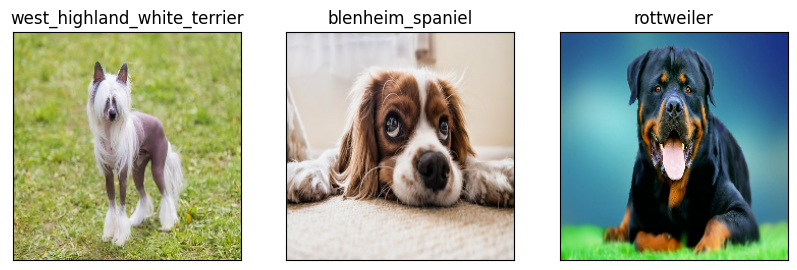

In [110]:
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)